# SVM и его ядра
__Суммарное количество баллов: 9__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][MS][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
import numpy as np
import copy
from cvxopt import spmatrix, matrix, solvers
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_moons, make_blobs
from typing import NoReturn, Callable

solvers.options['show_progress'] = False

In [2]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [3]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\ Gx \leq h\\ Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P = 
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\ 
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C 
    \end{array}
\right] \\ 
 G = 
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1 
    \end{array}
\right] $

In [4]:
from cvxopt.solvers import qp
from cvxopt import sparse

class LinearSVM:
    def __init__(self, C: float):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        
        """
        self.C = C
        self.support = None
        self.w = None
        self.w0 = None
        self.xi = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        N = X.shape[0]
        P = spmatrix([1, 1], [0, 1], [0,1], (N+3, N+3))
        q = matrix([matrix([0, 0, 0], (3, 1)), matrix(self.C * np.ones((N, 1)))] )
        yX = matrix(-np.array([y[i] * X[i] for i in range(X.shape[0])]))
        G = sparse([
            [spmatrix([], [], [], (N, 2)), yX],
            [spmatrix([], [], [], (N, 1)), matrix(-y)],
            [matrix(-np.eye(N)), matrix(-np.eye(N))]
        ])
        h = matrix([matrix(np.zeros((N, 1))), matrix(-np.ones((N, 1)))])
        res = np.array(qp(P, q, G, h)['x']).flatten()
        self.w = res[:2]
        self.w0 = res[2]
        self.xi = res[3:]

    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        res = X @ self.w + self.w0
        self.support = res[res <= 1]
        return res

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

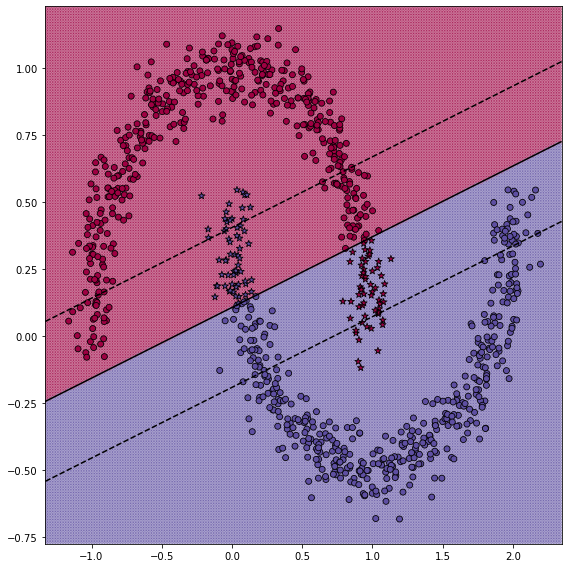

In [5]:
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

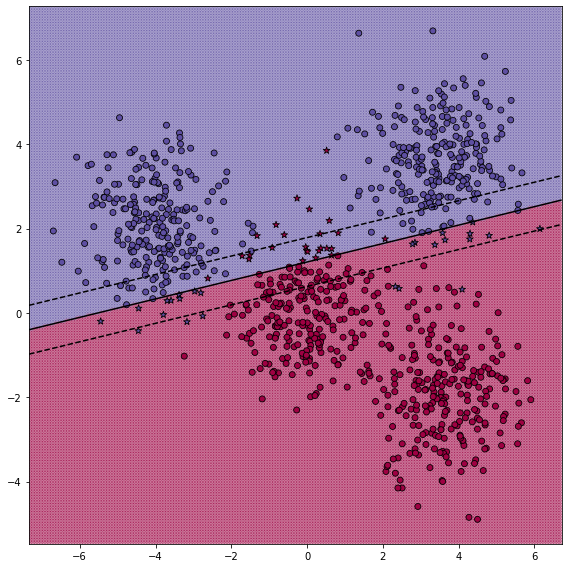

In [6]:
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [32]:
def get_polynomial_kernel(c=1, power=2):
    "Возвращает полиномиальное ядро с заданной константой и степенью"
    def foo(x: np.ndarray, y: np.ndarray):
        return (x @ y.T + c) ** power
    return foo

def get_gaussian_kernel(sigma=1.):
    "Возвращает ядро Гаусса с заданным коэффицинтом сигма"
    def foo(x, y):
        return np.exp( - np.linalg.norm(x[:, None, :] - y[None, :, :], axis=2) ** 2 / (2 * sigma ** 2))
    return foo

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\ Gx \leq h\\ Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ \sum y_i \alpha_i = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P = 
\left[ y_i y_j K(y_i, y_j) \right] \\ 
q = \left[ -1
\right] \\ 
 G = 
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0 
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [13]:
class KernelSVM:
    def __init__(self, C: float, kernel: Callable):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        kernel : Callable
            Функция ядра.
        
        """
        self.C = C
        self.kernel = kernel
        self.support = None
        self.alpha = None
        self.w0 = None
        self.y = None
        self.X_train = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        # print('X.shape in fit:', X.shape)
        N = X.shape[0]
        self.X_train = X
        self.y = y
        Kernel = self.kernel(self.X_train, self.X_train)
        P = matrix(np.array(y.reshape(-1, 1) * Kernel * y))     # y_i * K_ij * y_j
        q = matrix(-np.ones((N,1)))
        G = sparse([matrix(np.eye(N)), matrix(-np.eye(N))])
        h = matrix([matrix(self.C * np.ones((N,1))), matrix(np.zeros((N,1)))])
        A = matrix(y.astype(np.float64)).T
        # print(np.array(A).shape)
        b = matrix([0.0])
        # without flatten we get matrix (N, 1) (vertical vector), but we need common vector (N,)
        self.alpha = np.array(qp(P, q, G, h, A, b)['x']).flatten()
        # print('alpha.shape:',self.alpha.shape)
        self.w0 = np.mean(y - Kernel @ (self.alpha * y))    # y_i - sum_j(K_ij * a_j * y_j)


    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        K = self.kernel(X, self.X_train)
        res = K @ (self.alpha * self.y) + self.w0    # K_ij * a_j * y_j
        self.support = res[res <= 1]
        return res


    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

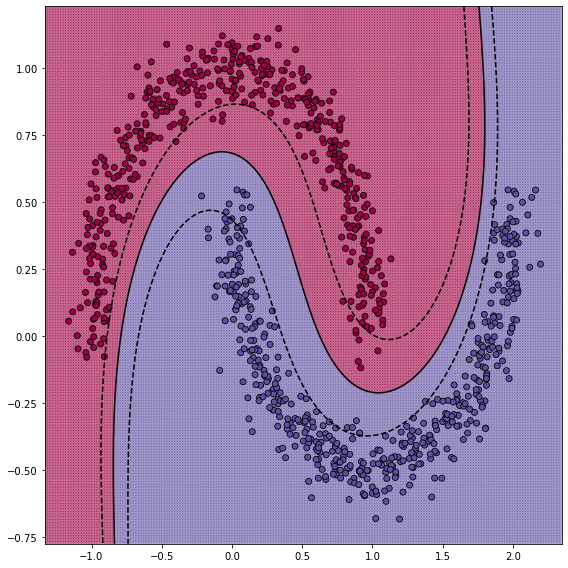

In [14]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

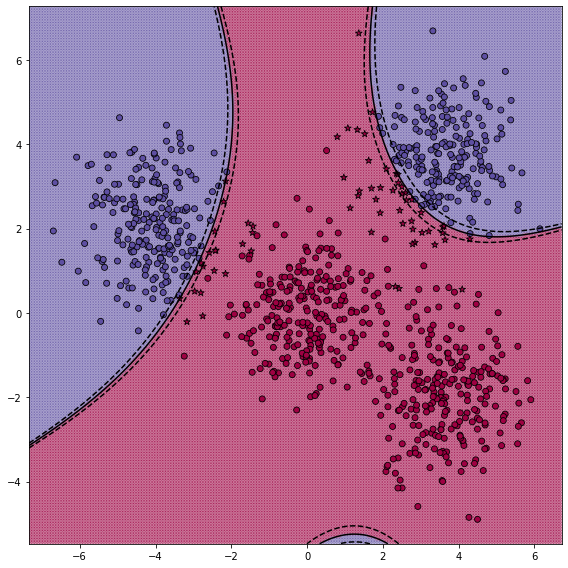

In [22]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

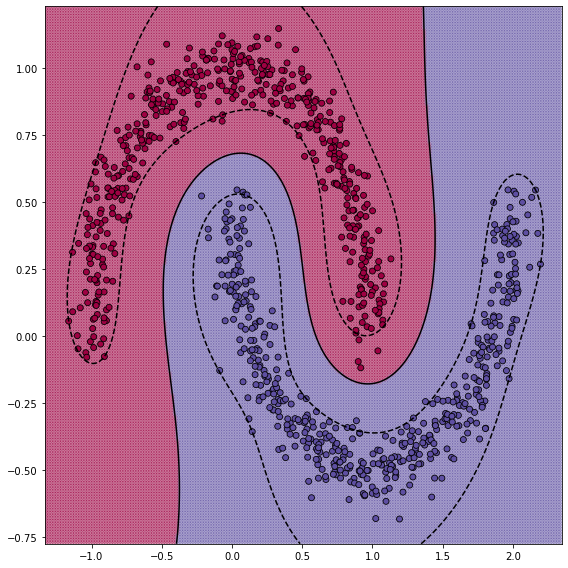

In [33]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

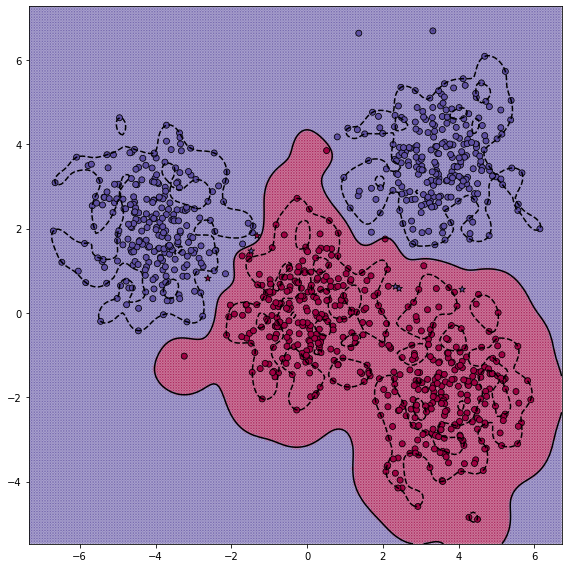

In [34]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

с = 0.001, d = 3


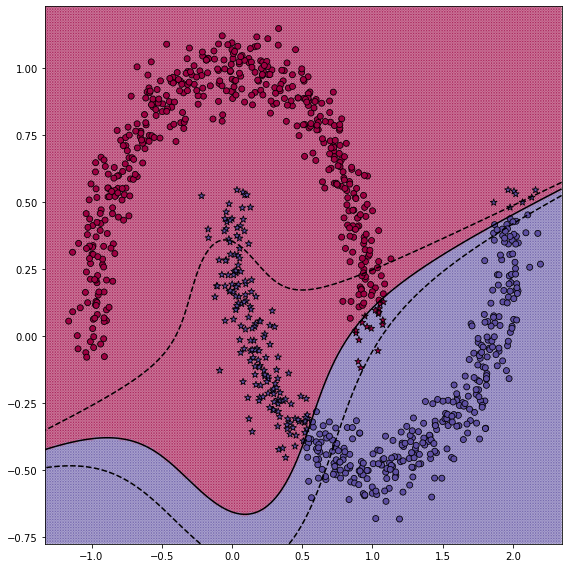

с = 0.1, d = 3


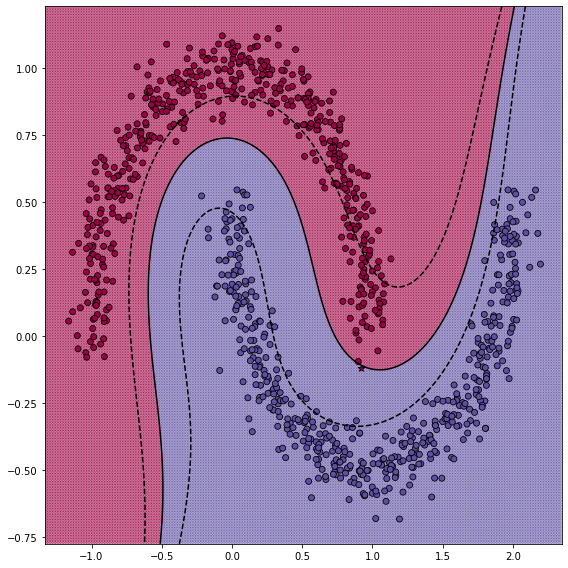

с = 1, d = 3


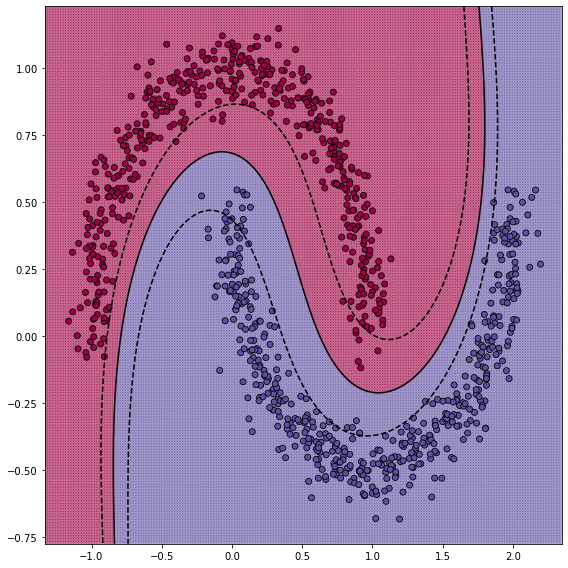

с = 10, d = 3


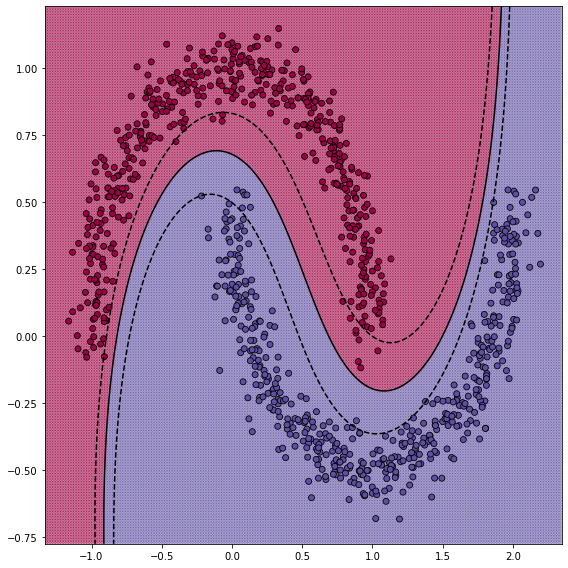

с = 100, d = 3


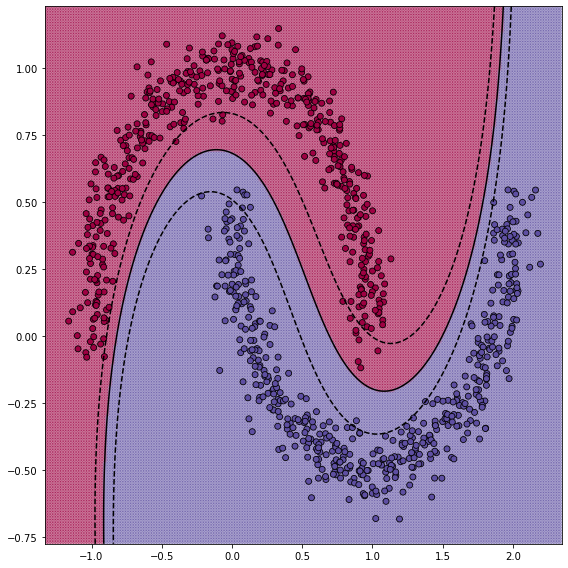

In [44]:
X, y = generate_dataset(True)
for c in [0.001, 0.1, 1, 10, 100]:

    svm = KernelSVM(1, kernel=get_polynomial_kernel(c, 3))
    svm.fit(X, y)
    visualize(svm, X, y)
    print(f'с = {c}, d = {3}')
    plt.show()

с = 1, d = 1


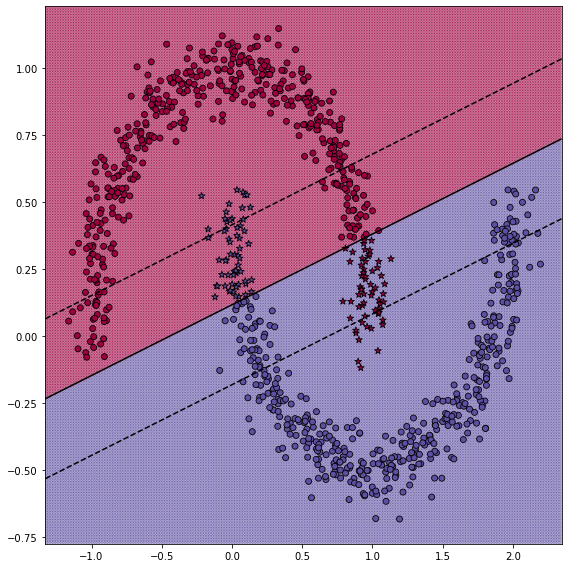

с = 1, d = 2


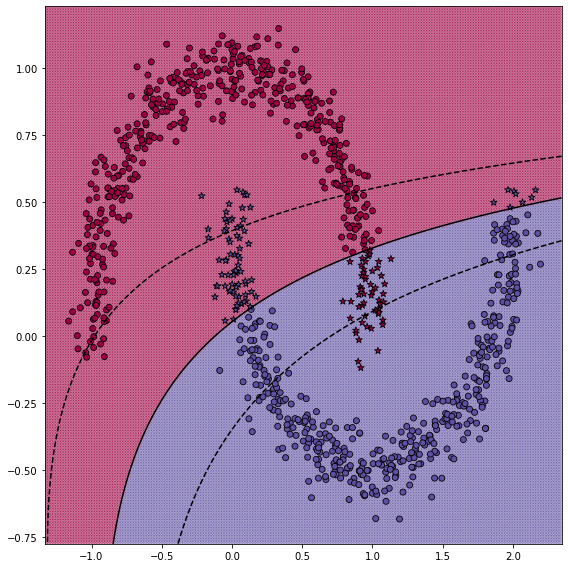

с = 1, d = 3


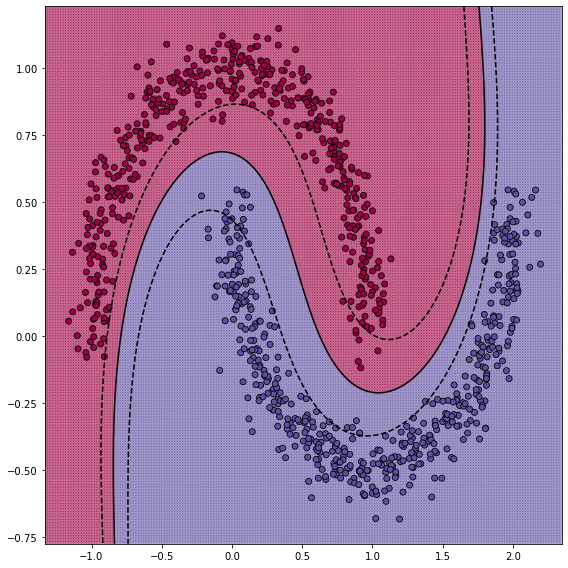

с = 1, d = 5


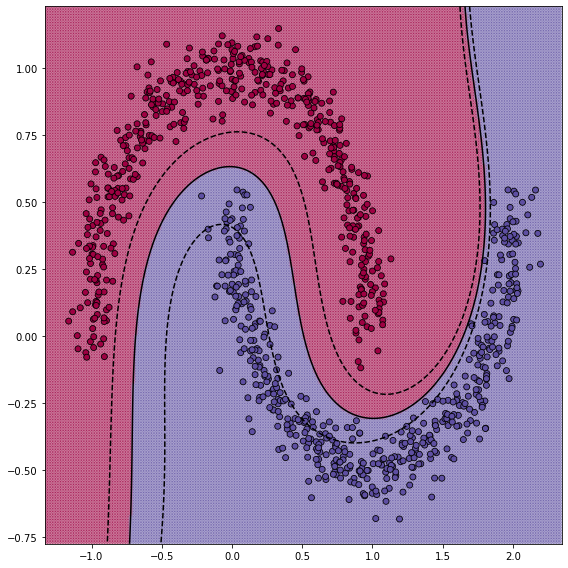

с = 1, d = 7


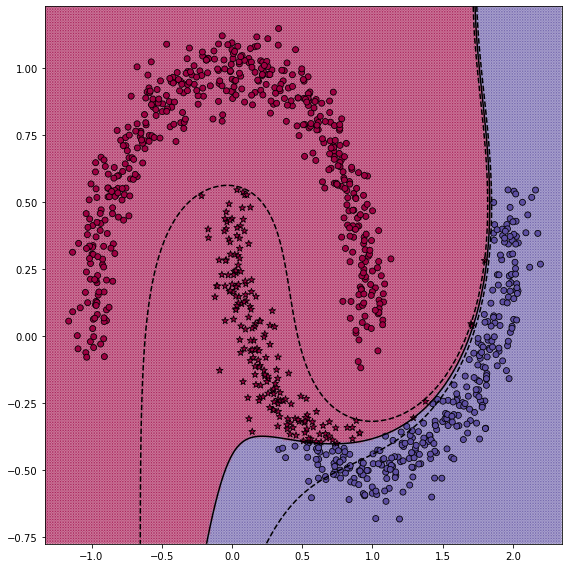

с = 1, d = 9


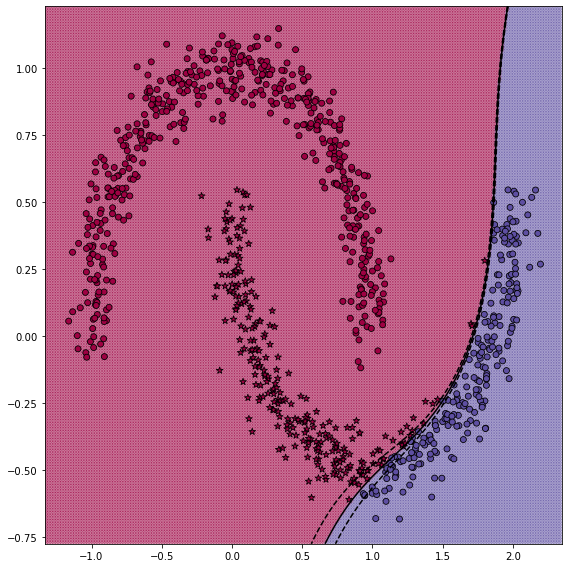

с = 1, d = 10


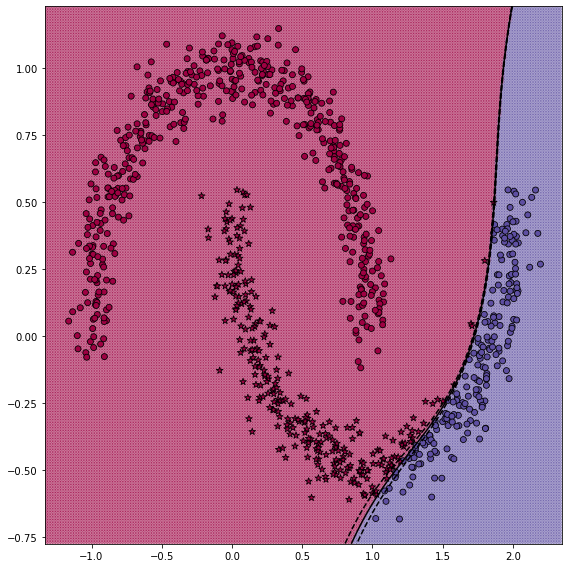

In [48]:
for d in [1, 2, 3, 5, 7, 9, 10]:
    X, y = generate_dataset(True)
    svm = KernelSVM(1, kernel=get_polynomial_kernel(1, d))
    svm.fit(X, y)
    visualize(svm, X, y)
    print(f'с = {1}, d = {d}')
    plt.show()

/tmp/ipykernel_14678/1407579756.py:23: UserWarning: No contour levels were found within the data range.
  plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')


sigma = 0.001


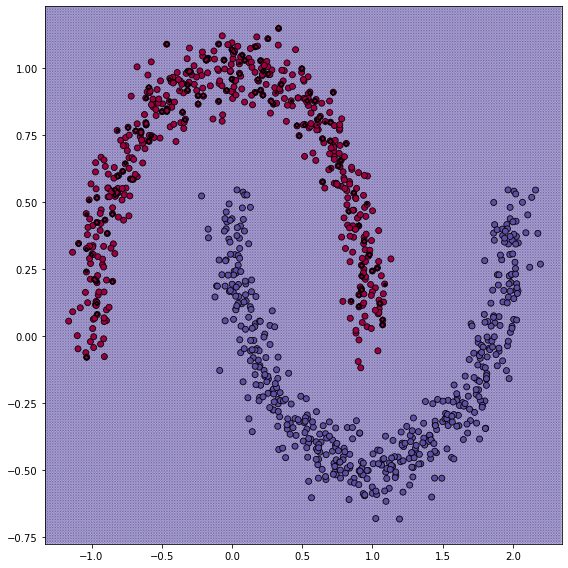

sigma = 0.01


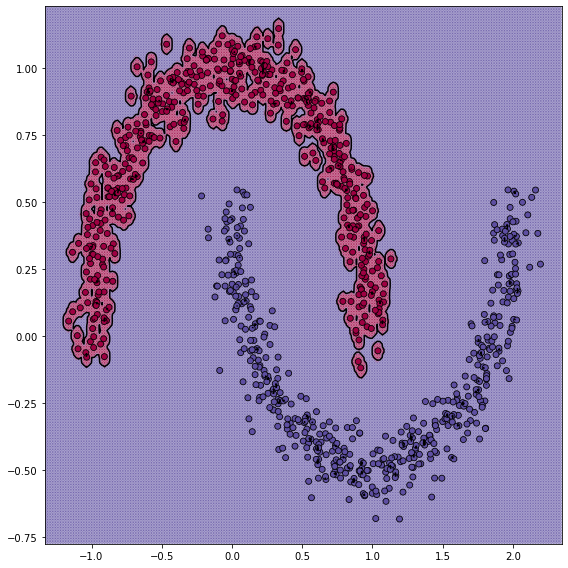

sigma = 0.4


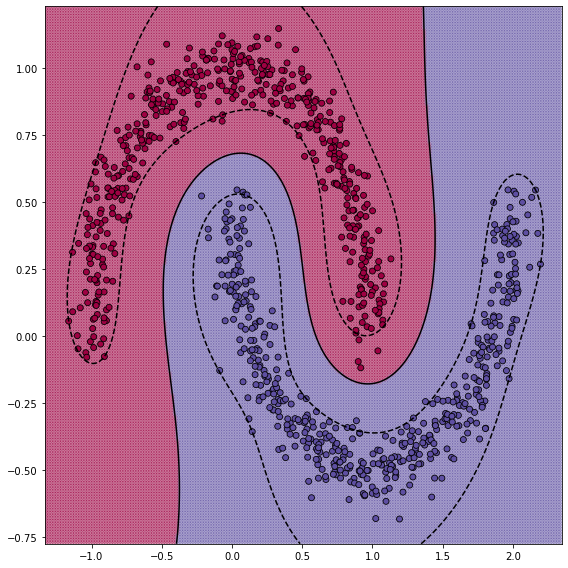

sigma = 1


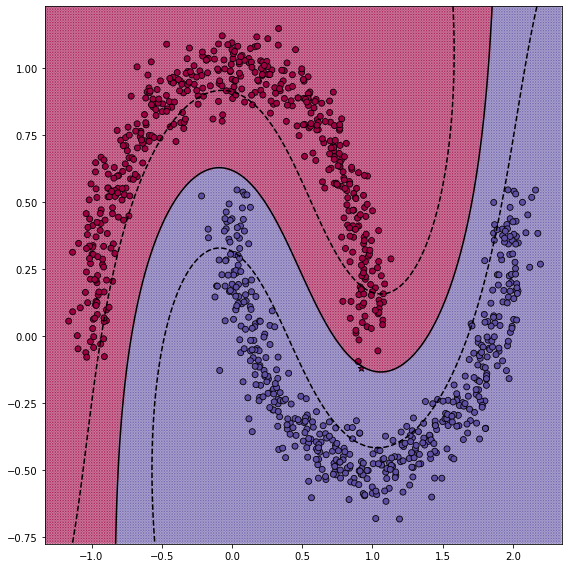

sigma = 5


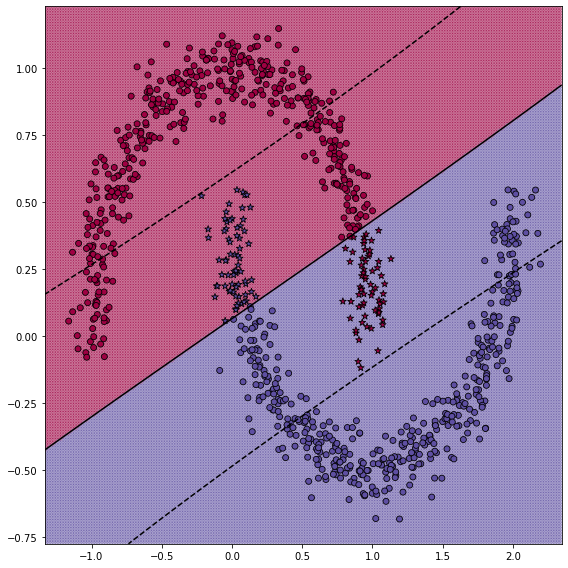

sigma = 10


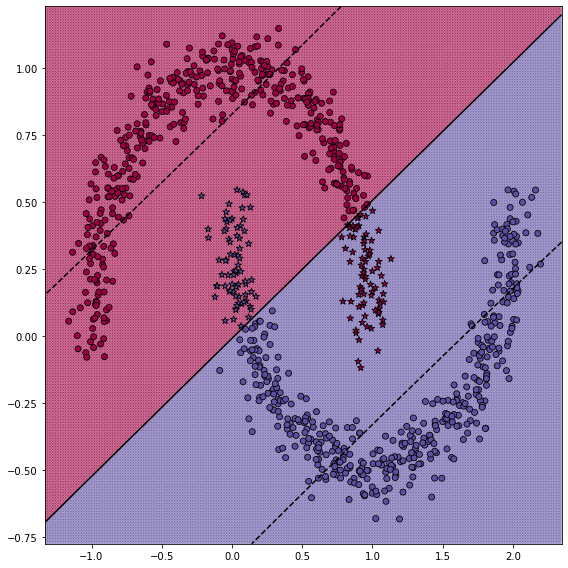

In [47]:
for sigma in [0.001, 0.01, 0.4, 1, 5, 10]:
    X, y = generate_dataset(True)
    svm = KernelSVM(1, kernel=get_gaussian_kernel(sigma))
    svm.fit(X, y)
    visualize(svm, X, y)
    print(f'sigma = {sigma}')
    plt.show()

При увеличении свободного члена в полиномиальном ядре, полоса лучше проходит между точками. Ширина тоже уменьшается. При сильном увеличении свободного члена эти изменения становятся незначительными

При степени полиномиального ядра d=1 получается просто обычный линейный SMV, при увеличении степени полоса все лучше разграничивает облака точек. Подозреваю, это связано с тем, что при увеличении степени d, мы переходим в пространство большей размерности и решая задачу там, получаем более "гибкую" полосу на исходной плоскости. Однако при слишком сильном увеличении d полоса портится, скорее всего потому, что размерность пространства становится на столько большим, что данных, точек на плоскости, становится слишком мало и поэтому происходит какое-то переобучения.

При слишком маленьких значениях sigma видно, что каждая точка данных ограничивается своей областью, ограниченной проекцией сложной полосы из другого пространства. Видимо это связано с тем, что если sigma слишком маленькая, то показатель экспоненты становится большим отрицательным и поэтому в двойственной задаче вклад от членов второго порядка становится мал. Тогда задача превращается в как будто максимизировать сумму альф. А это можно сделать если все альфы будут большими, т.е. стремиться к C. Но если alpha=С, то это плохая опорная точка, она за пределами полосы. Значит, очень много плохих опорных точек (в многомерном пространстве). Поэтому все ломается.

При слишком больших значениях sigma полоса становится какой-то плоской. Подозреваю, что поскольку в ядре sigma стоит в знаменателе, то все показатели экспоненты становятся близкими к нулю и поэтому значения ядра все оказываются близкими к единице, не зависимо от того, что мы туда подставляем. Поэтому матрица ядра становится постоянной и это очень напоминающее обычный svm (но не совсем)

